In [1]:
import os
import numpy as np
import pandas as pd
import librosa
import IPython.display as ipd
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential, layers
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report,f1_score

from tensorflow.keras.callbacks import EarlyStopping

from tqdm import tqdm

In [2]:
from scipy.io import wavfile as wav

In [3]:
# importing data
metadata=pd.read_csv('UrbanSound8K.csv')
metadata.head(10)

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.000000,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.500000,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.500000,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.000000,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.500000,72.500000,1,5,2,children_playing
5,100263-2-0-143.wav,100263,71.500000,75.500000,1,5,2,children_playing
6,100263-2-0-161.wav,100263,80.500000,84.500000,1,5,2,children_playing
7,100263-2-0-3.wav,100263,1.500000,5.500000,1,5,2,children_playing
8,100263-2-0-36.wav,100263,18.000000,22.000000,1,5,2,children_playing
9,100648-1-0-0.wav,100648,4.823402,5.471927,2,10,1,car_horn


In [4]:
metadata.columns.tolist()

['slice_file_name',
 'fsID',
 'start',
 'end',
 'salience',
 'fold',
 'classID',
 'class']

In [5]:
metadata['class'].value_counts()

dog_bark            1000
children_playing    1000
air_conditioner     1000
street_music        1000
engine_idling       1000
jackhammer          1000
drilling            1000
siren                929
car_horn             429
gun_shot             374
Name: class, dtype: int64

In [6]:
metadata['classID'].value_counts()

3    1000
2    1000
0    1000
9    1000
5    1000
7    1000
4    1000
8     929
1     429
6     374
Name: classID, dtype: int64

In [7]:
metadata.shape


(8732, 8)

In [8]:
metadata.isnull().sum()

slice_file_name    0
fsID               0
start              0
end                0
salience           0
fold               0
classID            0
class              0
dtype: int64

In [9]:
metadata.dtypes

slice_file_name     object
fsID                 int64
start              float64
end                float64
salience             int64
fold                 int64
classID              int64
class               object
dtype: object

In [10]:
metadata.describe()

,fsID,start,end,salience,fold,classID
count,8732.000000,8732.000000,8732.000000,8732.000000,8732.000000,8732.000000
mean,116033.493816,38.645409,42.253312,1.347000,5.385937,4.592877
std,57991.017218,74.292126,74.369669,0.476043,2.846820,2.894544
min,344.000000,0.000000,0.105962,1.000000,1.000000,0.000000
25%,69942.250000,3.000000,6.839398,1.000000,3.000000,2.000000
50%,118279.000000,10.376492,14.000000,1.000000,5.000000,4.000000
75%,166942.000000,35.131372,38.866979,2.000000,8.000000,7.000000
max,209992.000000,600.125356,604.125356,2.000000,10.000000,9.000000


In [11]:
metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8732 entries, 0 to 8731
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   slice_file_name  8732 non-null   object 
 1   fsID             8732 non-null   int64  
 2   start            8732 non-null   float64
 3   end              8732 non-null   float64
 4   salience         8732 non-null   int64  
 5   fold             8732 non-null   int64  
 6   classID          8732 non-null   int64  
 7   class            8732 non-null   object 
dtypes: float64(2), int64(4), object(2)
memory usage: 545.9+ KB


In [12]:
metadata['class'].unique()

array(['dog_bark', 'children_playing', 'car_horn', 'air_conditioner',
       'street_music', 'gun_shot', 'siren', 'engine_idling', 'jackhammer',
       'drilling'], dtype=object)

In [13]:
# numerical
numeric_df = metadata.select_dtypes(include=['int','float'])

numeric_df.shape

(8732, 6)

In [14]:

#categorical

categorical_df = metadata.select_dtypes(include=['object'])
categorical_df

,slice_file_name,class
0,100032-3-0-0.wav,dog_bark
1,100263-2-0-117.wav,children_playing
2,100263-2-0-121.wav,children_playing
3,100263-2-0-126.wav,children_playing
4,100263-2-0-137.wav,children_playing
...,...,...
8727,99812-1-2-0.wav,car_horn
8728,99812-1-3-0.wav,car_horn
8729,99812-1-4-0.wav,car_horn
8730,99812-1-5-0.wav,car_horn


# Exploratory Data Analysis

In [15]:
import librosa

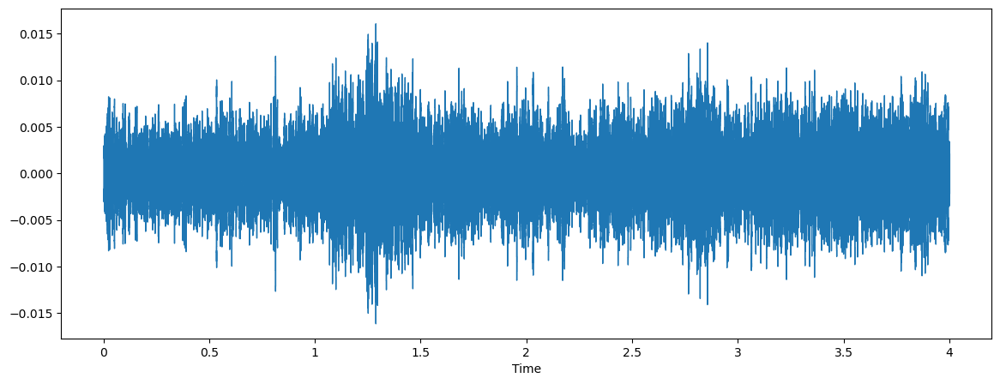

In [16]:
# children sound

plt.figure(figsize=(14,5))
data,sample_rate=librosa.load('fold5/100263-2-0-121.wav')
librosa.display.waveshow(data,sr=sample_rate,label=['Children sound waveplot'])

ipd.Audio('fold5/100263-2-0-121.wav')

In [17]:
sample_rate

22050

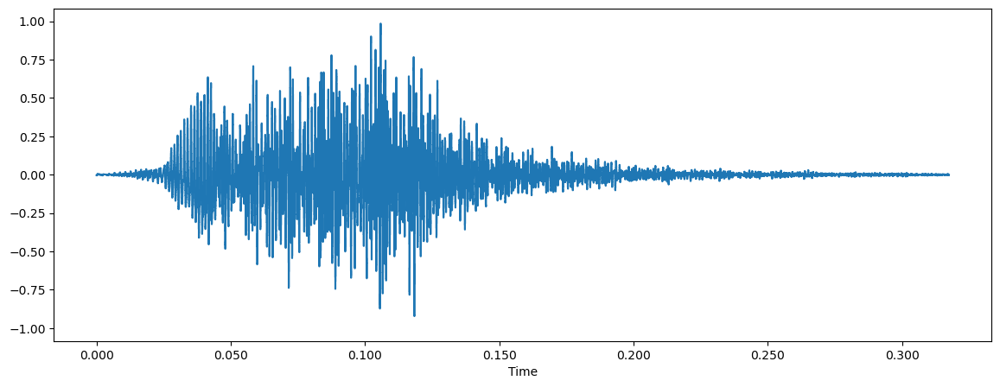

In [18]:
# dog sound

plt.figure(figsize=(14,5))
data,sample_rate=librosa.load('fold5/100032-3-0-0.wav')
librosa.display.waveshow(data,sr=sample_rate)

ipd.Audio('fold5/100032-3-0-0.wav')

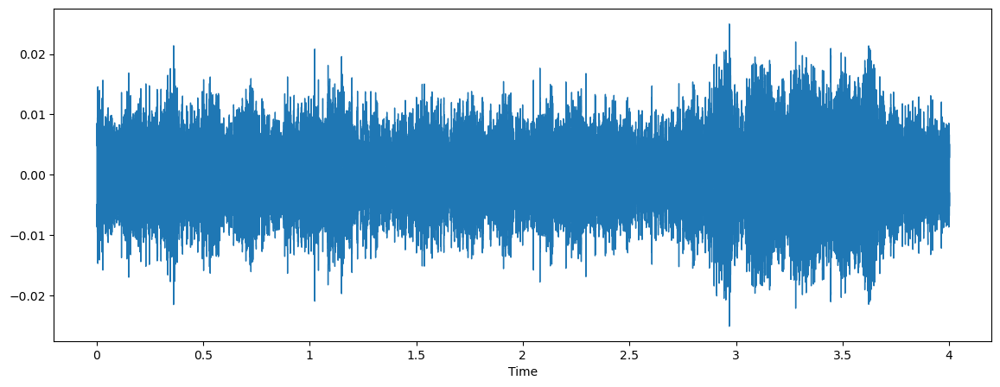

In [19]:
# car sound

plt.figure(figsize=(14,5))
data,sample_rate=librosa.load('fold7/99812-1-2-0.wav')
librosa.display.waveshow(data,sr=sample_rate)

ipd.Audio('fold7/99812-1-2-0.wav')

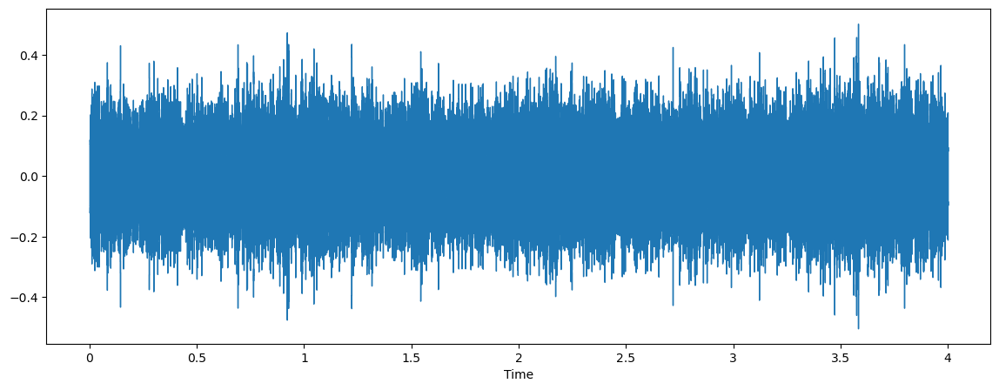

In [20]:
#  air_conditioner sound

plt.figure(figsize=(14,5))
data,sample_rate=librosa.load('fold5/100852-0-0-10.wav')
librosa.display.waveshow(data,sr=sample_rate)

ipd.Audio('fold5/100852-0-0-10.wav')

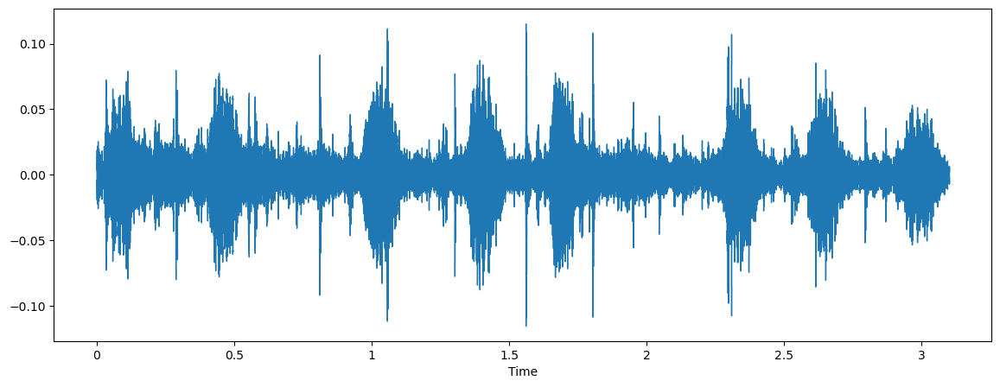

In [21]:


#  Street music sound

plt.figure(figsize=(14,5))
data,sample_rate=librosa.load('fold4/102102-3-0-0.wav')
librosa.display.waveshow(data,sr=sample_rate)

ipd.Audio('fold4/102102-3-0-0.wav')

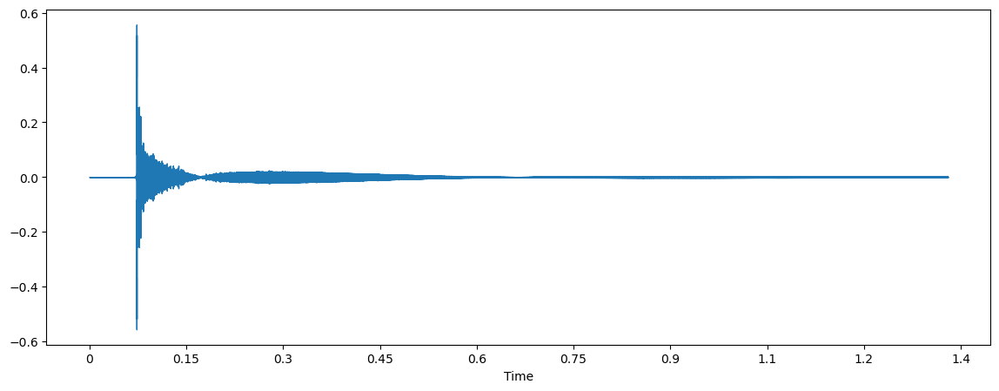

In [22]:


#  gun shot sound

plt.figure(figsize=(14,5))
data,sample_rate=librosa.load('fold1/197318-6-12-0.wav')
librosa.display.waveshow(data,sr=sample_rate)

ipd.Audio('fold1/197318-6-12-0.wav')

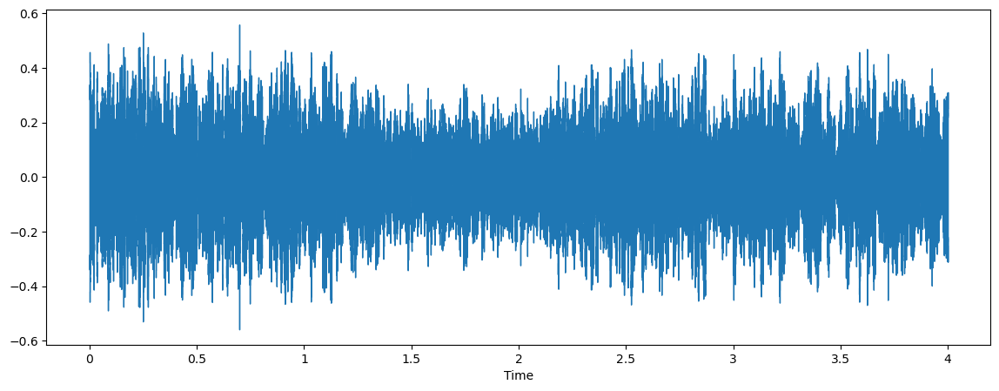

In [23]:


#  siren sound

plt.figure(figsize=(14,5))
data,sample_rate=librosa.load('fold5/203913-8-1-0.wav')
librosa.display.waveshow(data,sr=sample_rate)

ipd.Audio('fold5/203913-8-1-0.wav')

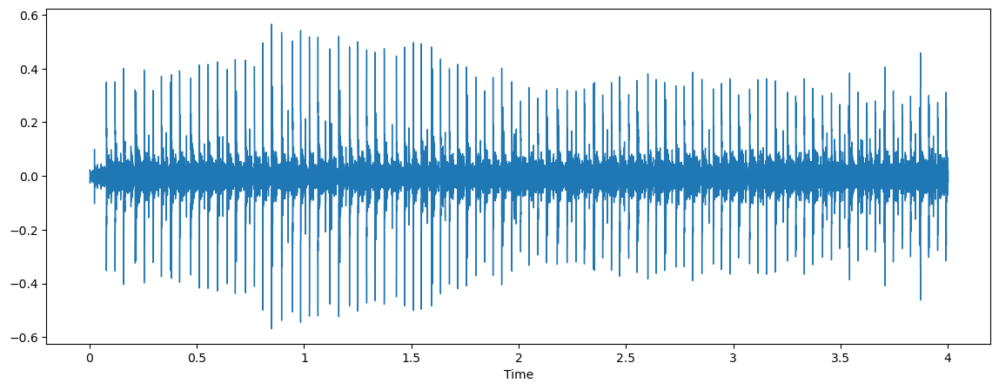

In [24]:

#  jackhammer sound

plt.figure(figsize=(14,5))
data,sample_rate=librosa.load('fold8/33340-7-1-0.wav')
librosa.display.waveshow(data,sr=sample_rate)

ipd.Audio('fold8/33340-7-1-0.wav')

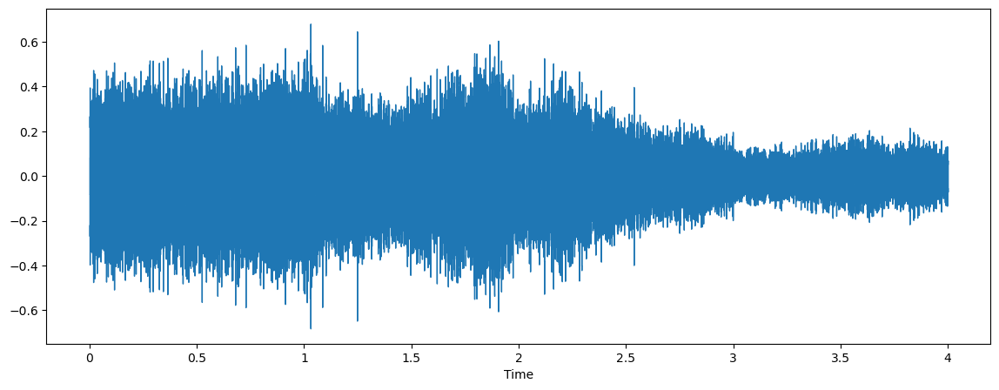

In [25]:

#  drilling sound

plt.figure(figsize=(14,5))
data,sample_rate=librosa.load('fold8/76085-4-0-27.wav')
librosa.display.waveshow(data,sr=sample_rate)

ipd.Audio('fold8/76085-4-0-27.wav')

In [26]:
data

array([-0.04714519,  0.01239407, -0.0468816 , ...,  0.03456743,
        0.02193546, -0.03188919], dtype=float32)

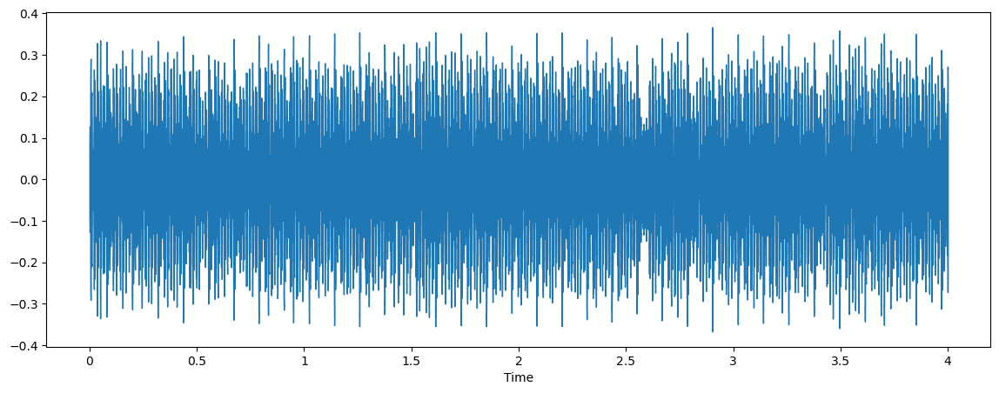

In [27]:
# engine_idling sound

plt.figure(figsize=(14,5))
data,sample_rate=librosa.load('fold9/62567-5-0-8.wav')
librosa.display.waveshow(data,sr=sample_rate)

ipd.Audio('fold9/62567-5-0-8.wav')

# Audio Classification Data Preprocessing

In [28]:
audio_file_path='fold9/62567-5-0-8.wav'
librosa_audio_data,librosa_sample_rate=librosa.load(audio_file_path)

In [29]:
print(librosa_audio_data)

[-0.04454739 -0.06758703 -0.0621115  ...  0.17931804  0.16537052
  0.16802698]


In [30]:
print(librosa_sample_rate) # 22 kHz per sec 

22050


The sampling rate --- typically fs in the digital signal processing literature, or sr in librosa --- is defined as 1/ts, where ts is the amount of time (in seconds) between successive samples. Equivalently, fs is the number of observations per second in the discretely sampled signal.

The standard sample rate for CDs, streaming, and consumer audio is 44.1 kHz, 48kHz is often used in audio for video, and 96 kHz or 192 kHz is used for archival audio.

kilohertz (kHz)

### plot with 1 channel 
i.e multi channels can convert into single channel in librosa which is ---> mono channel
and stereo as 2 channels 

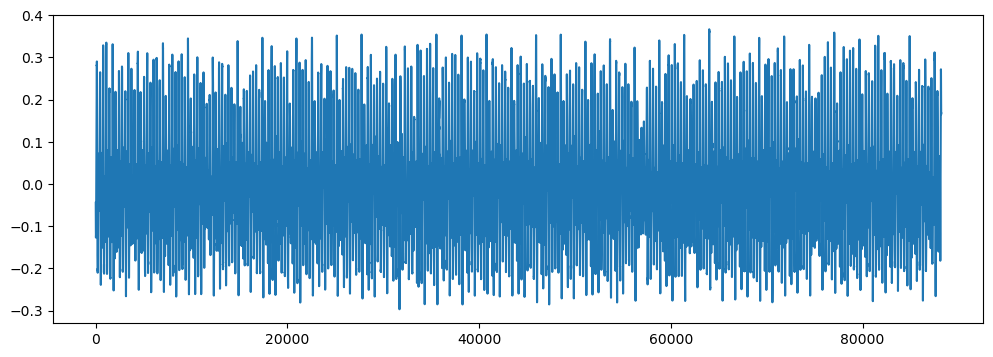

In [31]:
### Lets plot the librosa audio data
import matplotlib.pyplot as plt
# Original audio with 1 channel 
plt.figure(figsize=(12, 4))
plt.plot(librosa_audio_data)

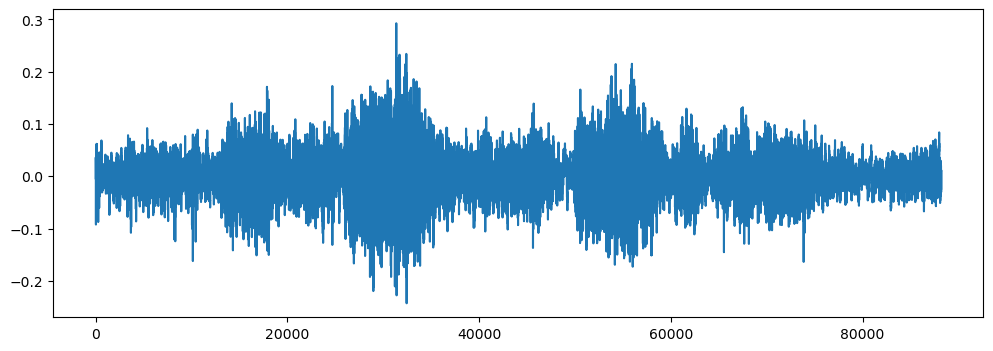

In [32]:
children_sound = 'fold1/160009-2-0-31.wav'
librosa_audio_data,librosa_sample_rate=librosa.load(children_sound)


### Lets plot the librosa audio data
import matplotlib.pyplot as pyplot
# Original audio with 1 channel 
plt.figure(figsize=(12, 4))
plt.plot(librosa_audio_data)

In [33]:
### Lets read with scipy
from scipy.io import wavfile as wav

In the scipy the audio can read with 2 channels i.e stereo

In [34]:

wave_sample_rate, wave_audio = wav.read(children_sound) 

In [35]:
wave_audio

array([[-90732288,  58229248],
       [-75483648,  91813376],
       [-74109696, 101991424],
       ...,
       [ 30809600,  17610240],
       [ 27803392,  17408512],
       [ 17941760,  10586624]])

In [36]:
wave_sample_rate  

44100

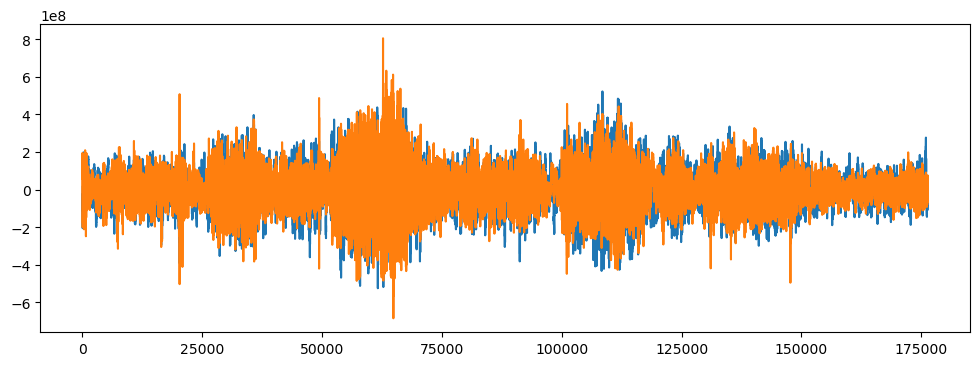

In [37]:

# Original audio with 2 channels 
plt.figure(figsize=(12, 4))
plt.plot(wave_audio)

In [38]:
sounds_freq = metadata['class'].value_counts().sort_values()
print(sounds_freq)

gun_shot             374
car_horn             429
siren                929
dog_bark            1000
children_playing    1000
air_conditioner     1000
street_music        1000
engine_idling       1000
jackhammer          1000
drilling            1000
Name: class, dtype: int64


<Axes: title={'center': 'Sounds'}, ylabel='class'>

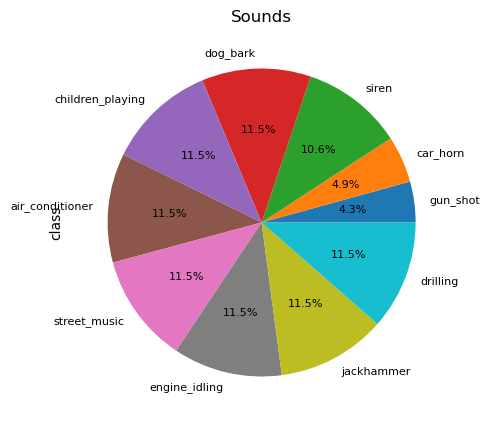

In [39]:
sounds_freq.plot(kind='pie', figsize=(5,5), title='Sounds', autopct='%1.1f%%', shadow = False, fontsize=8)

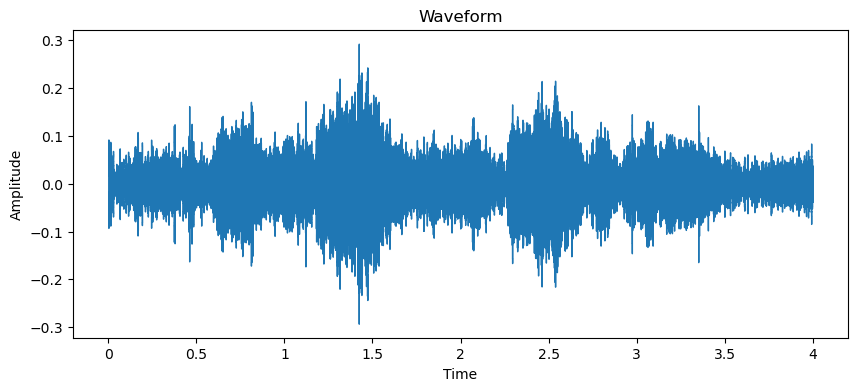

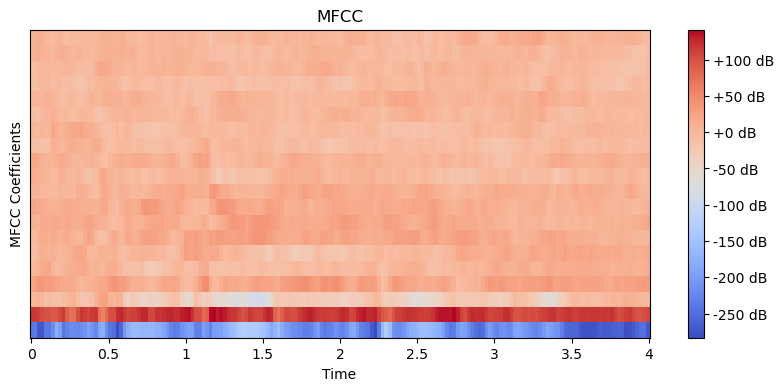

In [40]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Load an audio file
audio_path = 'fold1/160009-2-0-31.wav'
y, sr = librosa.load(audio_path)

# Compute MFCC coefficients
mfcc = librosa.feature.mfcc(y=y, sr=sr)

# Plot the wave graph
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Plot the MFCC coefficients
plt.figure(figsize=(10, 4))
librosa.display.specshow(mfcc, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('MFCC')
plt.xlabel('Time')
plt.ylabel('MFCC Coefficients')
plt.show()


Amplitude—distance between the resting position and the maximum displacement of the wave. Frequency—number of waves passing by a specific point per second. 

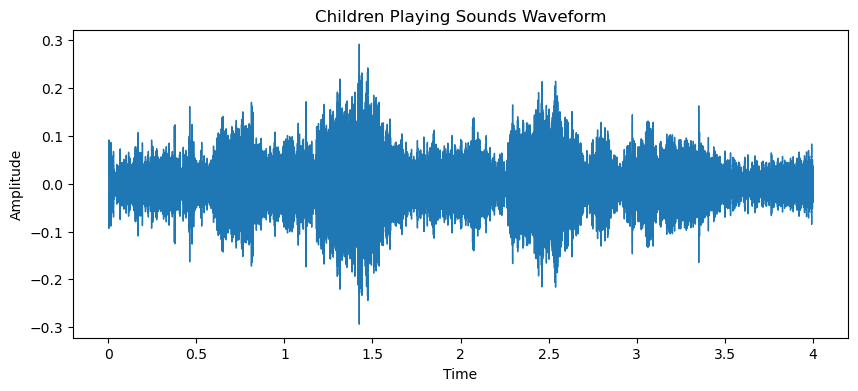

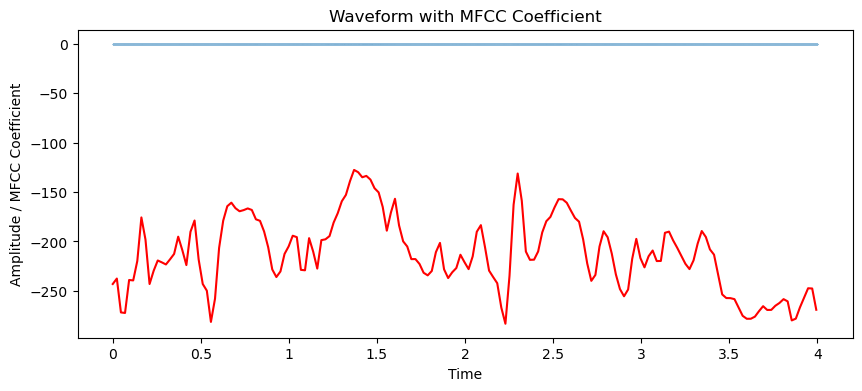

In [41]:

# Load an audio file
audio_path = 'fold1/160009-2-0-31.wav'
y, sr = librosa.load(audio_path)




# Plot the wave graph
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title('Children Playing Sounds Waveform')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Compute MFCC coefficients
mfcc = librosa.feature.mfcc(y=y, sr=sr)

# Select the desired MFCC coefficient to plot
mfcc_coefficient = 0  # Choose the coefficient index you want to visualize

# Create a time axis for the waveform
frames = range(mfcc.shape[1])
t = librosa.frames_to_time(frames)

# Retrieve the MFCC coefficient values for the selected coefficient
mfcc_coeff_values = mfcc[mfcc_coefficient, :]

# Plot the wave graph
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr, alpha=0.5)
plt.plot(t, mfcc_coeff_values, color='r')
plt.title('Waveform with MFCC Coefficient')
plt.xlabel('Time')
plt.ylabel('Amplitude / MFCC Coefficient')
plt.show()


ipd.Audio('fold1/160009-2-0-31.wav')

In [42]:
import librosa

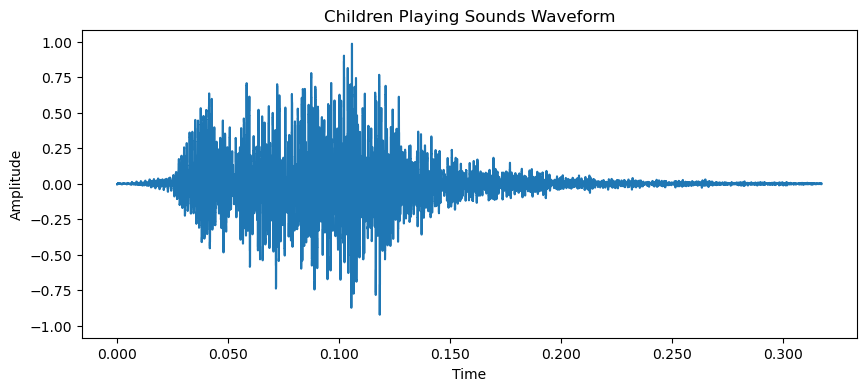

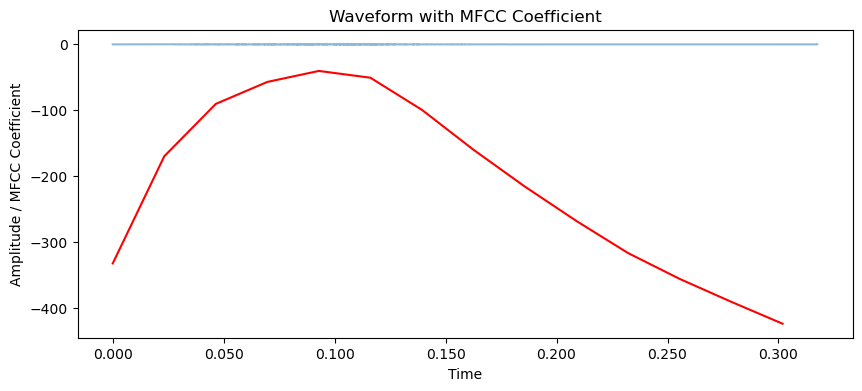

In [43]:

# Load an audio file
audio_path = 'fold5/100032-3-0-0.wav'
y, sr = librosa.load(audio_path)




# Plot the wave graph
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title('Children Playing Sounds Waveform')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Compute MFCC coefficients
mfcc = librosa.feature.mfcc(y=y, sr=sr)

# Select the desired MFCC coefficient to plot
mfcc_coefficient = 0  # Choose the coefficient index you want to visualize

# Create a time axis for the waveform
frames = range(mfcc.shape[1])
t = librosa.frames_to_time(frames)

# Retrieve the MFCC coefficient values for the selected coefficient
mfcc_coeff_values = mfcc[mfcc_coefficient, :]
mfcc_coeff_values = mfcc_coeff_values.T
# Plot the wave graph
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr, alpha=0.5)
plt.plot(t, mfcc_coeff_values, color='r')
plt.title('Waveform with MFCC Coefficient')
plt.xlabel('Time')
plt.ylabel('Amplitude / MFCC Coefficient')
plt.show()


ipd.Audio(audio_path)

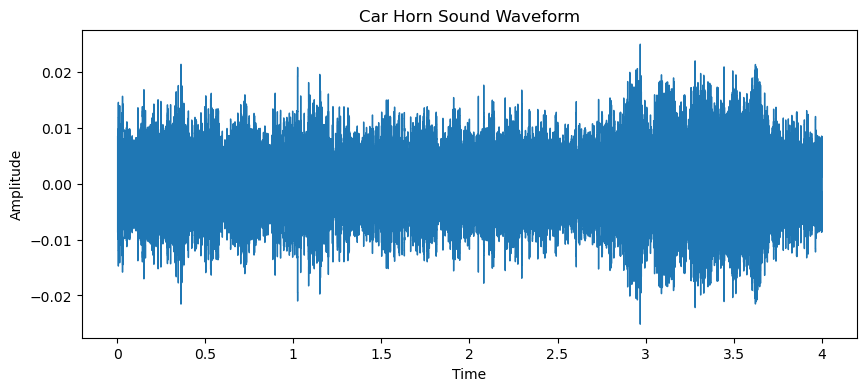

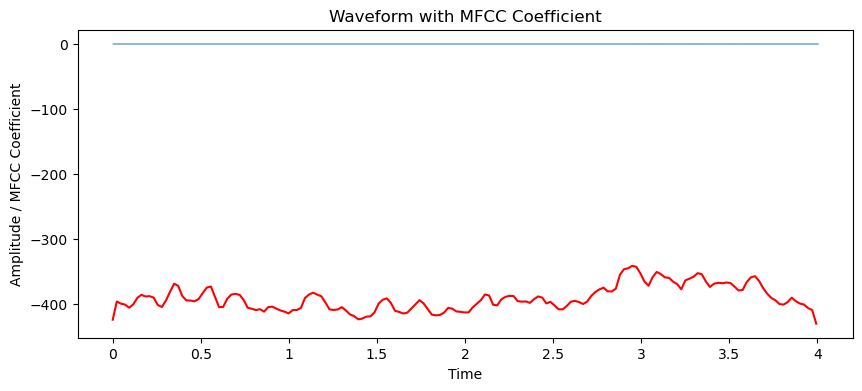

In [44]:

# Load an audio file
audio_path = 'fold7/99812-1-2-0.wav'
y, sr = librosa.load(audio_path)




# Plot the wave graph
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title('Car Horn Sound Waveform')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Compute MFCC coefficients
mfcc = librosa.feature.mfcc(y=y, sr=sr)

# Select the desired MFCC coefficient to plot
mfcc_coefficient = 0  # Choose the coefficient index you want to visualize

# Create a time axis for the waveform
frames = range(mfcc.shape[1])
t = librosa.frames_to_time(frames)

# Retrieve the MFCC coefficient values for the selected coefficient
mfcc_coeff_values = mfcc[mfcc_coefficient, :]

# Plot the wave graph
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr, alpha=0.5)
plt.plot(t, mfcc_coeff_values, color='r')
plt.title('Waveform with MFCC Coefficient')
plt.xlabel('Time')
plt.ylabel('Amplitude / MFCC Coefficient')
plt.show()


ipd.Audio(audio_path)

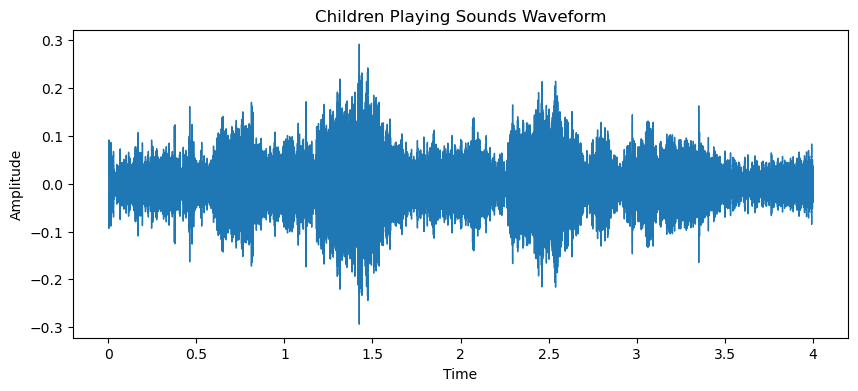

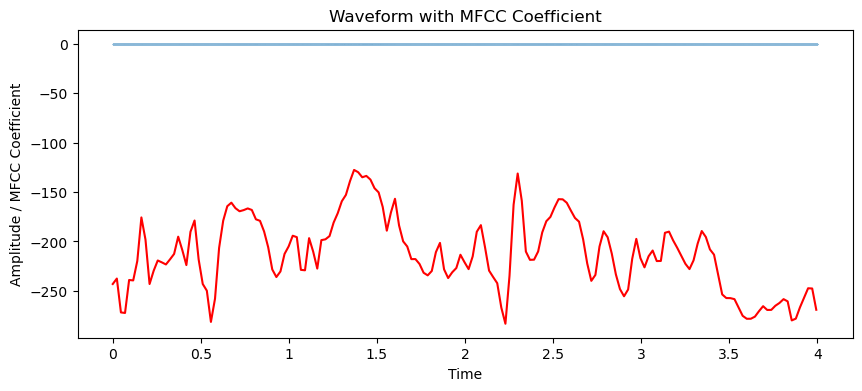

In [45]:

# Load an audio file
audio_path = 'fold1/160009-2-0-31.wav'
y, sr = librosa.load(audio_path)




# Plot the wave graph
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title('Children Playing Sounds Waveform')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Compute MFCC coefficients
mfcc = librosa.feature.mfcc(y=y, sr=sr)

# Select the desired MFCC coefficient to plot
mfcc_coefficient = 0  # Choose the coefficient index you want to visualize

# Create a time axis for the waveform
frames = range(mfcc.shape[1])
t = librosa.frames_to_time(frames)

# Retrieve the MFCC coefficient values for the selected coefficient
mfcc_coeff_values = mfcc[mfcc_coefficient, :]

# Plot the wave graph
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr, alpha=0.5)
plt.plot(t, mfcc_coeff_values, color='r')
plt.title('Waveform with MFCC Coefficient')
plt.xlabel('Time')
plt.ylabel('Amplitude / MFCC Coefficient')
plt.show()


ipd.Audio('fold1/160009-2-0-31.wav')

In [46]:
classes = metadata.groupby('classID')['class'].unique()
classes

classID
0     [air_conditioner]
1            [car_horn]
2    [children_playing]
3            [dog_bark]
4            [drilling]
5       [engine_idling]
6            [gun_shot]
7          [jackhammer]
8               [siren]
9        [street_music]
Name: class, dtype: object

## Extract Features

Here we will be using Mel-Frequency Cepstral Coefficients(MFCC) from the audio samples. The MFCC summarises the frequency distribution across the window size, so it is possible to analyse both the frequency and time characteristics of the sound. These audio representations will allow us to identify features for classification.

In [47]:
# extracting for a single auido file 

mfccs = librosa.feature.mfcc(y=librosa_audio_data, sr=librosa_sample_rate, n_mfcc=40) # n_mfcc---> can put any numbers-->30,50,..
print(mfccs.shape)

(40, 173)


In [48]:
mfccs

array([[-2.43117538e+02, -2.37583694e+02, -2.71900482e+02, ...,
        -2.47430664e+02, -2.47655197e+02, -2.69210175e+02],
       [ 1.16374680e+02,  1.17881836e+02,  1.12266235e+02, ...,
         9.66469269e+01,  1.01769073e+02,  1.06443314e+02],
       [-3.58997750e+00, -1.09750473e+00,  5.41582108e+00, ...,
         1.49188828e+00,  1.68426514e-01, -4.03214645e+00],
       ...,
       [-5.43324661e+00,  6.52227640e-01,  6.22940493e+00, ...,
         1.18643417e+01,  8.71120167e+00,  4.02907562e+00],
       [-5.19616699e+00, -2.30499029e+00, -1.16826129e+00, ...,
        -7.92566538e-01,  1.01359677e+00,  7.44264889e+00],
       [-2.52523828e+00, -8.44181478e-01,  1.52339351e+00, ...,
        -6.17070007e+00, -6.75045204e+00, -6.48598194e+00]], dtype=float32)

### Note:
The mfcc will convert the audio waves into coefficents to find easily by model 

# feature extraction 

In [49]:
audio_dataset_path='C:/Users/Harshit/Documents/DeepAudioClassification-main/'
metadata=pd.read_csv('UrbanSound8K.csv')
metadata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [50]:
def features_extractor(file):
    audio, sample_rate = librosa.load(file_name, res_type='soxr_hq') 
    mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
    mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)
    
    return mfccs_scaled_features
    

In [51]:
extracted_features=[]
for index_num,row in tqdm(metadata.iterrows()):
    file_name = os.path.join(os.path.abspath(audio_dataset_path),'fold'+str(row["fold"])+'/',str(row["slice_file_name"]))
    final_class_labels=row["class"]
    data=features_extractor(file_name)
    extracted_features.append([data,final_class_labels])

3555it [01:01, 52.91it/s]D:\Anaconda\Lib\site-packages\librosa\core\spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1323
  warnings.warn(
8322it [02:26, 66.11it/s]D:\Anaconda\Lib\site-packages\librosa\core\spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1103
  warnings.warn(
D:\Anaconda\Lib\site-packages\librosa\core\spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1523
  warnings.warn(
8732it [02:33, 56.88it/s]


In [52]:
### converting extracted_features to Pandas dataframe
extracted_features_df=pd.DataFrame(extracted_features,columns=['feature','class'])
extracted_features_df.head()

,feature,class
0,"[-211.93698, 62.581203, -122.81315, -60.745293...",dog_bark
1,"[-417.0052, 99.336624, -42.995586, 51.073326, ...",children_playing
2,"[-452.39316, 112.36253, -37.578068, 43.195866,...",children_playing
3,"[-406.47922, 91.1966, -25.043556, 42.78452, 11...",children_playing
4,"[-439.63873, 103.86224, -42.658787, 50.690277,...",children_playing


In [53]:
### Split the dataset into independent and dependent dataset
X=np.array(extracted_features_df['feature'].tolist())
y=np.array(extracted_features_df['class'].tolist())

In [54]:
X.shape

(8732, 40)

In [55]:
y

array(['dog_bark', 'children_playing', 'children_playing', ...,
       'car_horn', 'car_horn', 'car_horn'], dtype='<U16')

In [56]:
### Label Encoding
###y=np.array(pd.get_dummies(y))
### Label Encoder
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
labelencoder=LabelEncoder()
y=to_categorical(labelencoder.fit_transform(y))

In [57]:
y

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]], dtype=float32)

In [58]:
### Train Test Split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=0)

In [59]:
X_train

array([[-1.06784546e+02,  1.57434921e+02, -2.89516125e+01, ...,
         3.32510066e+00,  1.99334872e+00,  3.83965111e+00],
       [-1.13331306e+02,  1.18286263e+02, -9.51930332e+00, ...,
         2.73740816e+00, -5.40021610e+00, -1.75101447e+00],
       [-3.06374634e+02,  4.78324165e+01,  4.98511124e+01, ...,
        -4.13422763e-01, -1.14401674e+00,  2.37451530e+00],
       ...,
       [-4.26655701e+02,  9.15513382e+01,  4.19170332e+00, ...,
         9.74400163e-01,  5.15445411e-01,  9.15374756e-01],
       [-1.37251968e+02,  1.24268539e+02, -2.15997734e+01, ...,
         1.25008631e+00, -1.89575124e+00, -9.01497364e-01],
       [-4.18389374e+02,  2.06862335e+02,  7.23461866e+00, ...,
        -3.98612213e+00, -4.71784496e+00, -2.78926164e-01]], dtype=float32)

In [60]:
y

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]], dtype=float32)

In [61]:
X_train.shape

(6549, 40)

In [62]:
X_test.shape

(2183, 40)

In [63]:
y_train.shape

(6549, 10)

In [64]:
y_test.shape

(2183, 10)

# Model Building

In [65]:
import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,Activation,Flatten
from tensorflow.keras.optimizers import Adam
from sklearn import metrics

In [66]:
### No of classes
num_labels=y.shape[1]
num_labels

10

In [67]:
model=Sequential()
###first layer
model.add(Dense(100,input_shape=(40,)))
model.add(Activation('relu'))
model.add(Dropout(0.5))
###second layer
model.add(Dense(200))
model.add(Activation('relu'))
model.add(Dropout(0.5))
###third layer
model.add(Dense(100))
model.add(Activation('relu'))
model.add(Dropout(0.5))

###final layer
model.add(Dense(num_labels))
model.add(Activation('softmax'))

In [68]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               4100      
                                                                 
 activation (Activation)     (None, 100)               0         
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 200)               20200     
                                                                 
 activation_1 (Activation)   (None, 200)               0         
                                                                 
 dropout_1 (Dropout)         (None, 200)               0         
                                                                 
 dense_2 (Dense)             (None, 100)               2

In [69]:
model.compile(loss='categorical_crossentropy',metrics=['accuracy'],optimizer='adam')

In [70]:
## Trianing my model
from tensorflow.keras.callbacks import ModelCheckpoint
from datetime import datetime 

num_epochs = 100
num_batch_size = 32

checkpointer = ModelCheckpoint(filepath='saved_models/audio_classification.hdf5', 
                               verbose=1, save_best_only=True)
start = datetime.now()

model.fit(X_train, y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(X_test, y_test), callbacks=[checkpointer], verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

Epoch 1/100
187/205 [==========================>...] - ETA: 0s - loss: 13.1485 - accuracy: 0.1165
Epoch 1: val_loss improved from inf to 2.29179, saving model to saved_models\audio_classification.hdf5


D:\Anaconda\Lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


205/205 [==============================] - 3s 5ms/step - loss: 12.3087 - accuracy: 0.1182 - val_loss: 2.2918 - val_accuracy: 0.1223
Epoch 2/100
178/205 [=========================>....] - ETA: 0s - loss: 2.7391 - accuracy: 0.1215
Epoch 2: val_loss improved from 2.29179 to 2.28272, saving model to saved_models\audio_classification.hdf5
205/205 [==============================] - 1s 3ms/step - loss: 2.7038 - accuracy: 0.1211 - val_loss: 2.2827 - val_accuracy: 0.1131
Epoch 3/100
183/205 [=========================>....] - ETA: 0s - loss: 2.3704 - accuracy: 0.1204
Epoch 3: val_loss improved from 2.28272 to 2.27319, saving model to saved_models\audio_classification.hdf5
205/205 [==============================] - 1s 3ms/step - loss: 2.3646 - accuracy: 0.1220 - val_loss: 2.2732 - val_accuracy: 0.1122
Epoch 4/100
204/205 [============================>.] - ETA: 0s - loss: 2.2986 - accuracy: 0.1219
Epoch 4: val_loss improved from 2.27319 to 2.26516, saving model to saved_models\audio_classification

Epoch 26/100
188/205 [==========================>...] - ETA: 0s - loss: 1.5701 - accuracy: 0.4531
Epoch 26: val_loss improved from 1.41437 to 1.40305, saving model to saved_models\audio_classification.hdf5
205/205 [==============================] - 1s 3ms/step - loss: 1.5711 - accuracy: 0.4543 - val_loss: 1.4030 - val_accuracy: 0.5121
Epoch 27/100
180/205 [=========================>....] - ETA: 0s - loss: 1.5568 - accuracy: 0.4583
Epoch 27: val_loss improved from 1.40305 to 1.36395, saving model to saved_models\audio_classification.hdf5
205/205 [==============================] - 1s 3ms/step - loss: 1.5543 - accuracy: 0.4616 - val_loss: 1.3639 - val_accuracy: 0.5492
Epoch 28/100
190/205 [==========================>...] - ETA: 0s - loss: 1.5166 - accuracy: 0.4715
Epoch 28: val_loss improved from 1.36395 to 1.30307, saving model to saved_models\audio_classification.hdf5
205/205 [==============================] - 1s 2ms/step - loss: 1.5200 - accuracy: 0.4724 - val_loss: 1.3031 - val_accura

Epoch 52/100
183/205 [=========================>....] - ETA: 0s - loss: 1.1317 - accuracy: 0.6247
Epoch 52: val_loss improved from 0.99431 to 0.97508, saving model to saved_models\audio_classification.hdf5
205/205 [==============================] - 1s 3ms/step - loss: 1.1340 - accuracy: 0.6233 - val_loss: 0.9751 - val_accuracy: 0.6835
Epoch 53/100
204/205 [============================>.] - ETA: 0s - loss: 1.1368 - accuracy: 0.6152
Epoch 53: val_loss did not improve from 0.97508
205/205 [==============================] - 1s 2ms/step - loss: 1.1376 - accuracy: 0.6151 - val_loss: 0.9821 - val_accuracy: 0.6656
Epoch 54/100
200/205 [============================>.] - ETA: 0s - loss: 1.1145 - accuracy: 0.6181
Epoch 54: val_loss improved from 0.97508 to 0.96997, saving model to saved_models\audio_classification.hdf5
205/205 [==============================] - 1s 3ms/step - loss: 1.1145 - accuracy: 0.6189 - val_loss: 0.9700 - val_accuracy: 0.6725
Epoch 55/100
197/205 [===========================

179/205 [=========================>....] - ETA: 0s - loss: 1.0110 - accuracy: 0.6589
Epoch 79: val_loss did not improve from 0.85263
205/205 [==============================] - 1s 2ms/step - loss: 1.0261 - accuracy: 0.6569 - val_loss: 0.8601 - val_accuracy: 0.7306
Epoch 80/100
190/205 [==========================>...] - ETA: 0s - loss: 0.9804 - accuracy: 0.6762
Epoch 80: val_loss improved from 0.85263 to 0.84169, saving model to saved_models\audio_classification.hdf5
205/205 [==============================] - 1s 3ms/step - loss: 0.9870 - accuracy: 0.6746 - val_loss: 0.8417 - val_accuracy: 0.7251
Epoch 81/100
184/205 [=========================>....] - ETA: 0s - loss: 1.0201 - accuracy: 0.6615
Epoch 81: val_loss improved from 0.84169 to 0.82921, saving model to saved_models\audio_classification.hdf5
205/205 [==============================] - 1s 3ms/step - loss: 1.0246 - accuracy: 0.6618 - val_loss: 0.8292 - val_accuracy: 0.7375
Epoch 82/100
186/205 [==========================>...] - ETA: 0

In [71]:
test_accuracy=model.evaluate(X_test,y_test,verbose=0)
print(test_accuracy[1])

0.7544663548469543


In [72]:
X_test[25] # test audio coeff`s

array([-165.87494   ,  131.19745   , -122.17586   ,   28.797419  ,
        -12.622815  ,   17.120905  ,  -12.075943  ,   21.401464  ,
         -1.2505702 ,   -3.666342  ,   -5.0940785 ,    2.8353453 ,
         -1.690976  ,   -1.9302707 ,    8.263963  ,    8.323149  ,
          8.507785  ,   -2.8388283 ,    4.863742  ,    1.0803459 ,
          1.4093941 ,   -8.065087  ,   -1.794336  ,   -4.3433933 ,
          3.7207563 ,   -1.2269047 ,   -8.087373  ,   -0.27285507,
         14.952531  ,    5.026593  ,  -14.621008  ,   -4.6512694 ,
         -0.37579814,   13.919808  ,    0.5137291 ,    7.597829  ,
          1.5455941 ,   -8.806644  ,  -10.287633  ,    4.9215865 ],
      dtype=float32)

In [73]:
from sklearn.metrics import classification_report, confusion_matrix

# Load the best saved model
model.load_weights('saved_models/audio_classification.hdf5')

# Predict labels for the test set
y_pred = model.predict(X_test)

# Convert predictions to class labels
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

# Calculate performance metrics
classification_metrics = classification_report(y_true_classes, y_pred_classes)
confusion_mtx = confusion_matrix(y_true_classes, y_pred_classes)

# Print the performance metrics
print("Classification Report:")
print(classification_metrics)

print("Confusion Matrix:")
print(confusion_mtx)


69/69 [==============================] - 0s 1ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.82      0.74       244
           1       1.00      0.64      0.78       104
           2       0.51      0.80      0.62       259
           3       0.73      0.69      0.71       224
           4       0.88      0.72      0.79       256
           5       0.90      0.82      0.86       266
           6       0.94      0.58      0.72       107
           7       0.88      0.95      0.91       236
           8       0.94      0.85      0.89       252
           9       0.59      0.51      0.55       235

    accuracy                           0.76      2183
   macro avg       0.80      0.74      0.76      2183
weighted avg       0.78      0.76      0.76      2183

Confusion Matrix:
[[200   0  36   1   0   1   0   0   1   5]
 [  4  67   2   4   5   1   0   4   0  17]
 [ 15   0 206  12   3   5   2   1   0  15]
 [ 10   0  33 155 

In [74]:
from sklearn.metrics import classification_report

# Load the best saved model
w =model.load_weights('saved_models/audio_classification.hdf5')

# Predict labels for train and test data
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Convert predictions to class labels
y_train_pred_classes = np.argmax(y_train_pred, axis=1)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate performance metrics for train data
train_report = classification_report(np.argmax(y_train, axis=1), y_train_pred_classes)
print("Train Data Metrics:")
print(train_report)

# Calculate performance metrics for test data
test_report = classification_report(np.argmax(y_test, axis=1), y_test_pred_classes)
print("Test Data Metrics:")
print(test_report)


69/69 [==============================] - 0s 1ms/step
Train Data Metrics:
              precision    recall  f1-score   support

           0       0.71      0.86      0.78       756
           1       0.98      0.77      0.86       325
           2       0.53      0.86      0.65       741
           3       0.82      0.69      0.75       776
           4       0.97      0.79      0.87       744
           5       0.94      0.86      0.90       734
           6       0.85      0.57      0.68       267
           7       0.91      0.98      0.95       764
           8       0.92      0.88      0.90       677
           9       0.70      0.57      0.63       765

    accuracy                           0.80      6549
   macro avg       0.84      0.78      0.80      6549
weighted avg       0.82      0.80      0.80      6549

Test Data Metrics:
              precision    recall  f1-score   support

           0       0.68      0.82      0.74       244
           1       1.00      0.64      0

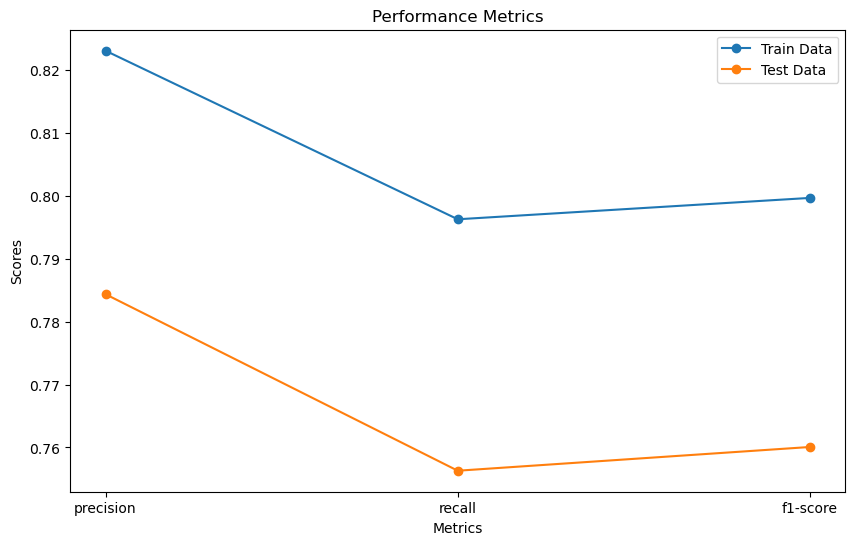

In [75]:

# Calculate performance metrics for train data
train_report = classification_report(np.argmax(y_train, axis=1), y_train_pred_classes, output_dict=True)
train_metrics = train_report['weighted avg']

# Calculate performance metrics for test data
test_report = classification_report(np.argmax(y_test, axis=1), y_test_pred_classes, output_dict=True)
test_metrics = test_report['weighted avg']

# Extract relevant metrics and scores
metrics = ['precision', 'recall', 'f1-score']
train_scores = [train_metrics[metric] for metric in metrics]
test_scores = [test_metrics[metric] for metric in metrics]

# Create x-axis labels
x_labels = range(len(metrics))

# Plot the metrics
plt.figure(figsize=(10, 6))
plt.plot(x_labels, train_scores, label='Train Data', marker='o')
plt.plot(x_labels, test_scores, label='Test Data', marker='o')
plt.xticks(x_labels, metrics)
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Performance Metrics')
plt.legend()
plt.show()


## Testing Some Test Audio Data
Steps

-Preprocess the new audio data

-predict the classes

-Invere transform your Predicted Label

In [80]:


filename="fold5/60846-0-0-1.wav"
audio, sample_rate = librosa.load(filename, res_type='soxr_hq') 
mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)

#print(mfccs_scaled_features)
mfccs_scaled_features=mfccs_scaled_features.reshape(1,-1)
#print(mfccs_scaled_features)
#print(mfccs_scaled_features.shape)
predicted_label=np.argmax(model.predict(mfccs_scaled_features),axis=1)
print(predicted_label)
prediction_class = labelencoder.inverse_transform(predicted_label) 
prediction_class


1/1 [==============================] - 0s 16ms/step
[0]


array(['air_conditioner'], dtype='<U16')

In [78]:
ipd.Audio(filename)

In [79]:
metadata[7000:7010]

,slice_file_name,fsID,start,end,salience,fold,classID,class
7000,60605-9-0-90.wav,60605,45.0,49.0,1,2,9,street_music
7001,60605-9-0-95.wav,60605,47.5,51.5,1,2,9,street_music
7002,60608-9-0-0.wav,60608,0.0,4.0,1,4,9,street_music
7003,60608-9-0-1.wav,60608,0.5,4.5,1,4,9,street_music
7004,60608-9-0-2.wav,60608,1.0,5.0,1,4,9,street_music
7005,60608-9-0-3.wav,60608,1.5,5.5,1,4,9,street_music
7006,60608-9-0-4.wav,60608,2.0,6.0,1,4,9,street_music
7007,60608-9-0-5.wav,60608,2.5,6.5,1,4,9,street_music
7008,60846-0-0-0.wav,60846,0.0,4.0,1,5,0,air_conditioner
7009,60846-0-0-1.wav,60846,0.5,4.5,1,5,0,air_conditioner
